In [1]:
from itertools import product
import warnings
from textwrap import shorten
import random
import builtins

import numpy as np
import pandas as pd

import pyperclip
from derive_conceptualspace.util.result_analysis_tools import df_to_latex
from misc_util.logutils import setup_logging
from misc_util.pretty_print import display, pretty_print as print
from derive_conceptualspace.util.threedfigure import ThreeDFigure
from derive_conceptualspace.semantic_directions.cluster_names import get_name_dict
from derive_conceptualspace.pipeline import SnakeContext, load_envfiles, cluster_loader
from derive_conceptualspace.util.result_analysis_tools import getfiles_allconfigs
from derive_conceptualspace.util.desc_object import DescriptionList
from derive_conceptualspace.evaluate.shallow_trees import classify_shallowtree

argmax = lambda l: max(enumerate(l), key=lambda x: x[1])[0]
unique = lambda iterable: list({i: None for i in iterable}.keys())


2022-03-31 17:50:30.235749: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/chris/Documents/JOBS/Uhrig-Gesture-Recog/skelshop_deps/openpose_cpu/build/src/openpose/
2022-03-31 17:50:30.235914: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


## Get the most 3 important dimensions from the Decision Tree and then display, colored by labelclass

In [6]:
setup_logging()
load_envfiles("siddata")
configs, print_cnf = getfiles_allconfigs("cluster_reprs", verbose=True)

<span style="font-size:11pt">There are 66 different parameter-combis for dataset <span style="color: #0000ff">siddata2022</span>:</span>

{'dataset': 'siddata2022',
 'language': 'de',
 'debug': 'False',
 'pp_components': ['mfauhcsd2', 'mfauhtcsldp'],
 'translate_policy': 'onlyorig',
 'min_words_per_desc': '80',
 'quantification_measure': ['ppmi', 'tfidf'],
 'embed_algo': 'mds',
 'embed_dimensions': ['3', '50', '200'],
 'extraction_method': 'tfidf',
 'dcm_quant_measure': ['count', 'ppmi', 'tfidf'],
 'kappa_weights': 'quadratic',
 'classifier_succmetric': ['kappa_count2rank_onlypos',
  'kappa_digitized_onlypos_2',
  'kappa_rank2rank_onlypos_min'],
 'prim_lambda': '0.5',
 'sec_lambda': '0.2',
 'cluster_direction_algo': 'reclassify'}

In [24]:
cnf = {**configs[0], "dcm_quant_measure": "count", "embed_dimensions": 200, "pp_components": "mfauhtcsldp", "quantification_measure": "tfidf"}

loaders = dict(clusters=cluster_loader, embedding=lambda **args: args["embedding"].embedding_, pp_descriptions=DescriptionList.from_json)
ctx = SnakeContext.loader_context(config=cnf, warn_filters=["DifferentFileWarning"])
clusters, embedding, descriptions, cluster_reprs = ctx.load("clusters", "embedding", "pp_descriptions", "cluster_reprs", loaders=loaders)

<span style="font-size:11pt">conf_file demanded config PP_COMPONENTS to be <span style="color: #ff0000">mfauhcsd2</span>, but force overwrites it to <span style="color: #0000ff">mfauhtcsldp</span></span>

<span style="font-size:11pt">conf_file demanded config QUANTIFICATION_MEASURE to be <span style="color: #ff0000">ppmi</span>, but force overwrites it to <span style="color: #0000ff">tfidf</span></span>

<span style="font-size:11pt">conf_file demanded config EMBED_DIMENSIONS to be <span style="color: #ff0000">3</span>, but force overwrites it to <span style="color: #0000ff">200</span></span>

<span style="font-size:11pt">conf_file demanded config CLASSIFIER_SUCCMETRIC to be <span style="color: #ff0000">kappa_count2rank_onlypos</span>, but force overwrites it to <span style="color: #0000ff">kappa_digitized_onlypos_2</span></span>

<span style="font-size:11pt">Config-File /home/chris/Documents/UNI_neu/Masterarbeit/Derive_Conceptualspace/config/derrac2015_edited.yml loaded.</span>

<span style="font-size:11pt">Running with the following settings [<span style="color: #ff00ff">e2a70a9bf2</span>]: CLASSIFIER: <span style="color: #0000ff">SVM</span>, CLASSIFIER_SUCCMETRIC: <span style="color: #ff0000">kappa_digitized_onlypos_2</span>, CLUSTER_DIRECTION_ALGO: <span style="color: #0000ff">reclassify</span>, DATASET: <span style="color: #ff0000">siddata2022</span>, DCM_QUANT_MEASURE: <span style="color: #0000ff">count</span>, DEBUG: <span style="color: #0000ff">False</span>, EMBED_ALGO: <span style="color: #0000ff">mds</span>, EMBED_DIMENSIONS: <span style="color: #ff0000">200</span>, EXTRACTION_METHOD: <span style="color: #ff0000">tfidf</span>, KAPPA_WEIGHTS: <span style="color: #0000ff">quadratic</span>, LANGUAGE: <span style="color: #0000ff">de</span>, MIN_WORDS_PER_DESC: <span style="color: #ff0000">80</span>, PP_COMPONENTS: <span style="color: #ff0000">mfauhtcsldp</span>, PRIM_LAMBDA: <span style="color: #0000ff">0.5</span>, QUANTIFICATION_MEASURE: <span style="color: #ff0000">tfidf</span>, RANDOM_SEED: <span style="color: #ff0000">None</span>, SEC_LAMBDA: <span style="color: #ff0000">0.2</span>, TRANSLATE_POLICY: <span style="color: #0000ff">onlyorig</span></span>

In [25]:
res = classify_shallowtree(clusters, embedding, descriptions, ctx.obj["dataset_class"], one_vs_rest=False, dt_depth=None, cluster_reprs=cluster_reprs, classes="fachbereich",
                           test_percentage_crossval=0, do_plot=False, verbose=False, return_features=False, clus_rep_algo=ctx.get_config("CLUS_REP_ALGO"))
assert res == 1

<span style="font-size:11pt">returning CLUS_REP_ALGO from default: <span style="color: #0000ff">top_1</span></span>

<span style="font-size:11pt">Using classes from fachbereich - 7319/11942 entities have a class</span>

<span style="font-size:11pt">Labels (10 classes): <span style="color: #0000ff">Sprach-/Literaturwissenschaften</span>: 1725, <span style="color: #0000ff">Erziehungs-/Kulturwissenschaften</span>: 2070, <span style="color: #0000ff">Kultur-/Geowissenschaften</span>: 1480, <span style="color: #0000ff">Sozialwissenschaften</span>: 715, <span style="color: #0000ff">Rechtswissenschaften</span>: 351, <span style="color: #0000ff">Humanwissenschaften</span>: 369, <span style="color: #0000ff">Biologie/Chemie</span>: 169, <span style="color: #0000ff">Mathematik/Informatik</span>: 186, <span style="color: #0000ff">Physik</span>: 145, <span style="color: #0000ff">Wirtschaftswissenschaften</span>: 109</span>

<span style="font-size:11pt">Eval-Settings: type: <span style="color: #0000ff">all-at-once</span>, DT-Depth: <span style="color: #0000ff">None</span>, train-test-split:<span style="color: #0000ff"> 0.0% in test-set </span></span>

derive_conceptualspace/evaluate/shallow_trees.py:149: UserWarning: Using the full data as training set without a test-set!


<span style="font-size:11pt">Accuracy: 1.00</span>

In [26]:
clfs, inputs, targets, scores, catnames = classify_shallowtree(clusters, embedding, descriptions, ctx.obj["dataset_class"], 
                                        one_vs_rest=True, dt_depth=3, test_percentage_crossval=0, classes="fachbereich", do_plot=False, verbose=False, return_features=True)

<span style="font-size:11pt">Using classes from fachbereich - 7319/11942 entities have a class</span>

<span style="font-size:11pt">Labels (10 classes): <span style="color: #0000ff">Sprach-/Literaturwissenschaften</span>: 1725, <span style="color: #0000ff">Erziehungs-/Kulturwissenschaften</span>: 2070, <span style="color: #0000ff">Kultur-/Geowissenschaften</span>: 1480, <span style="color: #0000ff">Sozialwissenschaften</span>: 715, <span style="color: #0000ff">Rechtswissenschaften</span>: 351, <span style="color: #0000ff">Humanwissenschaften</span>: 369, <span style="color: #0000ff">Biologie/Chemie</span>: 169, <span style="color: #0000ff">Mathematik/Informatik</span>: 186, <span style="color: #0000ff">Physik</span>: 145, <span style="color: #0000ff">Wirtschaftswissenschaften</span>: 109</span>

<span style="font-size:11pt">Eval-Settings: type: <span style="color: #0000ff">one-vs-rest</span>, DT-Depth: <span style="color: #0000ff">3</span>, train-test-split:<span style="color: #0000ff"> 0.0% in test-set </span></span>

derive_conceptualspace/evaluate/shallow_trees.py:149: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:149: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:149: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:149: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:149: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:149: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:149: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:149: UserWarning: Using the full data as training set without a test-set!
derive_conceptua

<span style="font-size:11pt">Per-Class-Scores: Biologie/Chemie: 0.88, Wirtschaftswissenschaften: 0.87, Sprach-/Literaturwissenschaften: 0.87, Erziehungs-/Kulturwissenschaften: 0.82, Physik: 0.80, Rechtswissenschaften: 0.97, Mathematik/Informatik: 0.91, Humanwissenschaften: 0.90, Kultur-/Geowissenschaften: 0.75, Sozialwissenschaften: 0.76</span>

<span style="font-size:11pt">Unweighted Mean Accuracy: 85.36%</span>

<span style="font-size:11pt">Weighted Mean Accuracy: 82.77%</span>

## Get most important features

now I want to get the most important features ==> find the nonzero elements from clf.feature_importances_ (and their dimension-name) 
but also the actual tree-decision as you see when plotting it with graphviz -> maybe https://scikit-learn.org/stable/auto_examples/tree/plot_unveil_tree_structure.html#sphx-glr-auto-examples-tree-plot-unveil-tree-structure-py ?

In [27]:
# def get_decision_path(X_test, clf, catnames, axnames):
#     n_nodes = clf.tree_.node_count
#     children_left = clf.tree_.children_left
#     children_right = clf.tree_.children_right
#     classes = [catnames[clf.classes_[np.argmax(i)]] for i in clf.tree_.value]
#     node_depth = np.zeros(shape=n_nodes, dtype=np.int64)
#     is_leaves = np.zeros(shape=n_nodes, dtype=bool)
#     stack = [(0, 0)]  # start with the root node id (0) and its depth (0)
#     while len(stack) > 0:
#         # `pop` ensures each node is only visited once
#         node_id, depth = stack.pop()
#         node_depth[node_id] = depth
#         # If the left and right child of a node is not the same we have a split node
#         is_split_node = children_left[node_id] != children_right[node_id]
#         # If a split node, append left and right children and depth to `stack` so we can loop through them
#         if is_split_node:
#             stack.append((children_left[node_id], depth + 1))
#             stack.append((children_right[node_id], depth + 1))
#         else:
#             is_leaves[node_id] = True
#     print("The binary tree structure has {n} nodes and has the following tree structure:\n".format(n=n_nodes))
#     for i in range(n_nodes):
#         if is_leaves[i]:
#             print("{space}node={node} is a leaf node - category {cat}".format(space=node_depth[i] * "\t", node=i, cat=classes[i]))
#         else:
#             print("{space}node={node} is a split node: go to node {left} if {feature} <= {threshold} else to node {right}. Cat={cat}".format(
#                     space=node_depth[i] * "\t", node=i, left=children_left[i], feature=axnames[clf.tree_.feature[i]], threshold=clf.tree_.threshold[i], right=children_right[i], cat=classes[i]))
            
# axnames = [f",".join([i]+clusters["clusters"][i][:2]) for i in inputs.columns]
# for clf, catname in zip(clfs, catnames):
#     get_decision_path(inputs, clf, catname, axnames)
#     print("Feature Importances:\n", {elem: axnames[i] for i, elem in enumerate(clf.feature_importances_) if elem > 0})
#     print("=="*50+"\n"+"=="*50)

### Use feature_importance

In [28]:
print("Cluster-Representation-Algorithm: *b*", ctx.get_config("CLUS_REP_ALGO"), "*b*")
cluster_names = get_name_dict(clusters["clusters"], cluster_reprs, ctx.get_config("CLUS_REP_ALGO"))
axnames = list(cluster_names.values())

<span style="font-size:11pt">Cluster-Representation-Algorithm: <span style="color: #0000ff"> top_1 </span></span>

In [29]:
for clf, catname in zip(clfs, catnames):
    feats = [(i[0], round(i[1],3)) for i in sorted({axnames[i]: elem for i, elem in enumerate(clf.feature_importances_) if elem > 0}.items(), key=lambda x:x[1], reverse=True)][:3]
    # print(catname[1].ljust(max(len(i[1]) for i in catnames)), feats)
    builtins.print(catname[1].ljust(max(len(i[1]) for i in catnames)), ", ".join(i[0] for i in feats))

Biologie/Chemie                  aktivierung studierend, brd, madchen
Wirtschaftswissenschaften        center betriebswirtschaftlich kompetenz, zitat, religionsunterrichts
Sprach-/Literaturwissenschaften  deutsch literaturwissenschaft, sprache, partie
Erziehungs-/Kulturwissenschaften erziehungswissenschaft, religionsunterrichts, didaktisch methodisch
Physik                           neu entwicklung, regelmassig aktiv teilnahme ubernahme, unterrichtsforschung
Rechtswissenschaften             juristisch, einfuhrung allgemein, bgb
Mathematik/Informatik            programmiersprache, menge, szene
Humanwissenschaften              psychologie, metaphysik, fehler
Kultur-/Geowissenschaften        tourismus, gi, stadtgeographie
Sozialwissenschaften             arbeitsmarkt, regieren, multiple


### Use early decisions

In [30]:
def get_decisions(X_test, clf, catnames, axnames):
    n_nodes = clf.tree_.node_count
    children_left = clf.tree_.children_left
    children_right = clf.tree_.children_right
    classes = [catnames[clf.classes_[np.argmax(i)]] for i in clf.tree_.value]
    node_depth = np.zeros(shape=n_nodes, dtype=np.int64)
    is_leaves = np.zeros(shape=n_nodes, dtype=bool)
    stack = [(0, 0)]  # start with the root node id (0) and its depth (0)
    while len(stack) > 0:
        # `pop` ensures each node is only visited once
        node_id, depth = stack.pop()
        node_depth[node_id] = depth
        # If the left and right child of a node is not the same we have a split node
        is_split_node = children_left[node_id] != children_right[node_id]
        # If a split node, append left and right children and depth to `stack` so we can loop through them
        if is_split_node:
            stack.append((children_left[node_id], depth + 1))
            stack.append((children_right[node_id], depth + 1))
        else:
            is_leaves[node_id] = True
    alls = {}
    for i in range(n_nodes):
        if not is_leaves[i]:
            alls.setdefault(node_depth[i], []).append((axnames[clf.tree_.feature[i]], clf.tree_.threshold[i]))  
    return (alls[0]+alls[1]) if len(alls) > 1 else alls[0]

In [31]:
for clf, catname in zip(clfs, catnames):
    # print(catname[1].ljust(max(len(i[1]) for i in catnames)), get_decisions(inputs, clf, catname, axnames))
    builtins.print(catname[1].ljust(max(len(i[1]) for i in catnames)), ", ".join(i[0] for i in get_decisions(inputs, clf, catname, axnames)))

Biologie/Chemie                  aktivierung studierend, brd, berucksichtigung finden
Wirtschaftswissenschaften        center betriebswirtschaftlich kompetenz, religionsunterrichts, zitat
Sprach-/Literaturwissenschaften  deutsch literaturwissenschaft, sprache, okumenisch
Erziehungs-/Kulturwissenschaften erziehungswissenschaft, religionsunterrichts, english for
Physik                           neu entwicklung, unterrichtsforschung, regelmassig aktiv teilnahme ubernahme
Rechtswissenschaften             juristisch, einfuhrung allgemein, bgb
Mathematik/Informatik            programmiersprache, menge, menschenbild
Humanwissenschaften              psychologie, metaphysik, seit beginn
Kultur-/Geowissenschaften        tourismus, gi, stadtgeographie
Sozialwissenschaften             arbeitsmarkt, regieren, multiple


## Ok, quickly a table from this

In [72]:
clfs_d1, _, _, scores_d1, catnames = classify_shallowtree(clusters, embedding, descriptions, ctx.obj["dataset_class"], 
                                     one_vs_rest=True, dt_depth=1, test_percentage_crossval=0.33, classes="fachbereich", do_plot=False, verbose=False, return_features=True)

clfs_d3, _, _, scores_d3, catnames = classify_shallowtree(clusters, embedding, descriptions, ctx.obj["dataset_class"], 
                                     one_vs_rest=True, dt_depth=3, test_percentage_crossval=0.33, classes="fachbereich", do_plot=False, verbose=False, return_features=True)

<span style="font-size:11pt">Using classes from fachbereich - 7319/11942 entities have a class</span>

<span style="font-size:11pt">Labels (10 classes): <span style="color: #0000ff">Sprach-/Literaturwissenschaften</span>: 1725, <span style="color: #0000ff">Erziehungs-/Kulturwissenschaften</span>: 2070, <span style="color: #0000ff">Kultur-/Geowissenschaften</span>: 1480, <span style="color: #0000ff">Sozialwissenschaften</span>: 715, <span style="color: #0000ff">Rechtswissenschaften</span>: 351, <span style="color: #0000ff">Humanwissenschaften</span>: 369, <span style="color: #0000ff">Biologie/Chemie</span>: 169, <span style="color: #0000ff">Mathematik/Informatik</span>: 186, <span style="color: #0000ff">Physik</span>: 145, <span style="color: #0000ff">Wirtschaftswissenschaften</span>: 109</span>

<span style="font-size:11pt">Eval-Settings: type: <span style="color: #0000ff">one-vs-rest</span>, DT-Depth: <span style="color: #0000ff">1</span>, train-test-split:<span style="color: #0000ff"> 33.0% in test-set </span></span>

<span style="font-size:11pt">Per-Class-Scores: Biologie/Chemie: 0.62, Wirtschaftswissenschaften: 0.79, Sprach-/Literaturwissenschaften: 0.85, Erziehungs-/Kulturwissenschaften: 0.75, Physik: 0.77, Rechtswissenschaften: 0.91, Mathematik/Informatik: 0.92, Humanwissenschaften: 0.86, Kultur-/Geowissenschaften: 0.77, Sozialwissenschaften: 0.68</span>

<span style="font-size:11pt">Unweighted Mean Accuracy: 79.27%</span>

<span style="font-size:11pt">Weighted Mean Accuracy: 78.84%</span>

<span style="font-size:11pt">Using classes from fachbereich - 7319/11942 entities have a class</span>

<span style="font-size:11pt">Labels (10 classes): <span style="color: #0000ff">Sprach-/Literaturwissenschaften</span>: 1725, <span style="color: #0000ff">Erziehungs-/Kulturwissenschaften</span>: 2070, <span style="color: #0000ff">Kultur-/Geowissenschaften</span>: 1480, <span style="color: #0000ff">Sozialwissenschaften</span>: 715, <span style="color: #0000ff">Rechtswissenschaften</span>: 351, <span style="color: #0000ff">Humanwissenschaften</span>: 369, <span style="color: #0000ff">Biologie/Chemie</span>: 169, <span style="color: #0000ff">Mathematik/Informatik</span>: 186, <span style="color: #0000ff">Physik</span>: 145, <span style="color: #0000ff">Wirtschaftswissenschaften</span>: 109</span>

<span style="font-size:11pt">Eval-Settings: type: <span style="color: #0000ff">one-vs-rest</span>, DT-Depth: <span style="color: #0000ff">3</span>, train-test-split:<span style="color: #0000ff"> 33.0% in test-set </span></span>

<span style="font-size:11pt">Per-Class-Scores: Biologie/Chemie: 0.85, Wirtschaftswissenschaften: 0.90, Sprach-/Literaturwissenschaften: 0.87, Erziehungs-/Kulturwissenschaften: 0.78, Physik: 0.78, Rechtswissenschaften: 0.96, Mathematik/Informatik: 0.93, Humanwissenschaften: 0.87, Kultur-/Geowissenschaften: 0.75, Sozialwissenschaften: 0.79</span>

<span style="font-size:11pt">Unweighted Mean Accuracy: 84.77%</span>

<span style="font-size:11pt">Weighted Mean Accuracy: 81.64%</span>

In [86]:
styles = [{'selector': 'th', 'props': [('vertical-align','top'),('text-align','left')]}]  
styler = lambda df: df.style.set_table_styles(styles).set_properties(**{'text-align': 'left'})

In [109]:
ORDER = [i[0] for i in sorted(enumerate(catnames), key=lambda x: list(ctx.obj["dataset_class"].FB_MAPPER.values()).index(x[1][1]))]
di = {}
for clf_d3, catname, score_d3, clf_d1, score_d1 in zip([clfs_d3[i] for i in ORDER], [catnames[i] for i in ORDER], [scores_d3[i] for i in ORDER], [clfs_d1[i] for i in ORDER], [scores_d1[i] for i in ORDER]):
    di[catname[1]] = {**{f"dim_{num+1}": i[0] for num, i in enumerate(get_decisions(inputs, clf_d3, catname, axnames))}, "D3 Score": f"{score_d3:.2%}", "D1 Score": f"{score_d1:.2%}"}
df = pd.DataFrame(di).T    

pyperclip.copy(df_to_latex(df, styler, rotate=False, caption="Top 3 Directions to detect the respective Faculty from the data."))
styler(df)

,dim_1,dim_2,dim_3,D3 Score,D1 Score
Sozialwissenschaften,arbeitsmarkt,regieren,multiple,78.60%,67.63%
Kultur-/Geowissenschaften,tourismus,gi,stadtgeographie,75.50%,77.44%
Erziehungs-/Kulturwissenschaften,erziehungswissenschaft,okumenisch,english for,78.02%,75.50%
Physik,neu entwicklung,mitarbeiterinnen,regelmassig aktiv teilnahme ubernahme,78.27%,77.36%
Biologie/Chemie,aktivierung studierend,brd,berucksichtigung finden,85.22%,62.13%
Mathematik/Informatik,programmiersprache,menge,hoffnung,93.00%,91.85%
Sprach-/Literaturwissenschaften,deutsch literaturwissenschaft,sprache,okumenisch,86.71%,85.10%
Humanwissenschaften,psychologie,metaphysik,internationalisierung,86.84%,85.51%
Wirtschaftswissenschaften,center betriebswirtschaftlich kompetenz,religionsunterrichts,design,89.65%,79.10%
Rechtswissenschaften,juristisch,bgb,bgb,95.86%,91.10%


# Let's plot!

In [32]:
clfs, inputs, targets, scores, catnames = classify_shallowtree(clusters, embedding, descriptions, ctx.obj["dataset_class"], 
                                        one_vs_rest=True, dt_depth=2, test_percentage_crossval=0, classes="fachbereich", do_plot=False, verbose=False, return_features=True)

<span style="font-size:11pt">Using classes from fachbereich - 7319/11942 entities have a class</span>

<span style="font-size:11pt">Labels (10 classes): <span style="color: #0000ff">Sprach-/Literaturwissenschaften</span>: 1725, <span style="color: #0000ff">Erziehungs-/Kulturwissenschaften</span>: 2070, <span style="color: #0000ff">Kultur-/Geowissenschaften</span>: 1480, <span style="color: #0000ff">Sozialwissenschaften</span>: 715, <span style="color: #0000ff">Rechtswissenschaften</span>: 351, <span style="color: #0000ff">Humanwissenschaften</span>: 369, <span style="color: #0000ff">Biologie/Chemie</span>: 169, <span style="color: #0000ff">Mathematik/Informatik</span>: 186, <span style="color: #0000ff">Physik</span>: 145, <span style="color: #0000ff">Wirtschaftswissenschaften</span>: 109</span>

<span style="font-size:11pt">Eval-Settings: type: <span style="color: #0000ff">one-vs-rest</span>, DT-Depth: <span style="color: #0000ff">2</span>, train-test-split:<span style="color: #0000ff"> 0.0% in test-set </span></span>

derive_conceptualspace/evaluate/shallow_trees.py:149: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:149: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:149: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:149: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:149: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:149: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:149: UserWarning: Using the full data as training set without a test-set!
derive_conceptualspace/evaluate/shallow_trees.py:149: UserWarning: Using the full data as training set without a test-set!
derive_conceptua

<span style="font-size:11pt">Per-Class-Scores: Biologie/Chemie: 0.78, Wirtschaftswissenschaften: 0.90, Sprach-/Literaturwissenschaften: 0.85, Erziehungs-/Kulturwissenschaften: 0.79, Physik: 0.75, Rechtswissenschaften: 0.95, Mathematik/Informatik: 0.85, Humanwissenschaften: 0.86, Kultur-/Geowissenschaften: 0.69, Sozialwissenschaften: 0.62</span>

<span style="font-size:11pt">Unweighted Mean Accuracy: 80.28%</span>

<span style="font-size:11pt">Weighted Mean Accuracy: 77.84%</span>

In [33]:
best_split = argmax(scores)
display(f"Best category to split: *r*{catnames[best_split][1]}*r* with score {max(scores):.2%}")

important_feats = [i[0] for i in sorted({axnames[i]: elem for i, elem in enumerate(clf.feature_importances_) if elem > 0}.items(), key=lambda x:x[1], reverse=True)][:3]
early_splits = [i[0] for i in get_decisions(inputs, clf, catnames, axnames)]
if important_feats == early_splits:
    print("Most important Features: & Early splits:", ", ".join([f"*b*{i}*b*" for i in important_feats]))
else:
    print("Most important Features:", ", ".join([f"*b*{i}*b*" for i in important_feats]), "Early splits:", ", ".join([f"*b*{i}*b*" for i in early_splits]))

<span style="font-size:11pt">Best category to split: <span style="color: #ff0000">Rechtswissenschaften</span> with score 95.35%</span>

<span style="font-size:11pt">Most important Features: & Early splits: <span style="color: #0000ff">arbeitsmarkt</span>, <span style="color: #0000ff">regieren</span>, <span style="color: #0000ff">multiple</span></span>

In [34]:
def plot_boundary(inputs, clf, targets, catnames, axnames, descriptions=None, split_samples=True, plotboxkwargs=None):
    early_splits = [i[0] for i in get_decisions(inputs, clf, catnames, axnames)]
    if len(unique(early_splits)) < 3:
        warnings.warn("<3 dimensions!!")
    originputs = inputs
    inputcols = inputs.columns
    inputs = inputs[[i[0].split(",")[0] for i in get_decisions(inputs, clf, catnames, axnames)]]

    quaders = list(product(*[((0, i[1]), (i[1] + .001, inputs.max()[n])) for n, i in enumerate(get_decisions(inputs, clf, catnames, axnames))]))
    index_nrs = [list(inputcols).index(i) for i in inputs.columns]
    tmp = [np.zeros(len(quaders)) for _ in range(len(inputcols))]
    for num, elem in enumerate(index_nrs):
        tmp[elem] = np.array([[i[0] for i in j] for j in quaders]).T[num]
    boundary_targets = clf.predict(np.column_stack(tmp))

    def get_coords(quad):
        coords = list(zip(*list(product(*quad))))
        arg = np.array(list(zip(*coords))).T
        arg = arg.T[[0, 2, 6, 4, 1, 3, 7, 5]].T  # this is the order from "Mesh Cube" from docs: https://plotly.com/python/3d-mesh/
        return [list(i) for i in arg]

    inpt = {"pos": {"color": "red"}, "neg": {"color": "blue"}}
    for posneg in inpt.keys():
        inpt[posneg]["inpt"] = inputs.iloc[np.where(targets)] if posneg == "pos" else inputs.iloc[np.where(1 - targets)]
        predict_probas = [f"{i[1]:.0%}" for i in clf.predict_proba(originputs.loc[inpt[posneg]["inpt"].index].values)]
        inpt[posneg]["custom_data"] = [{"Name": list(inpt[posneg]["inpt"].index)[i], "Is-Class-Prob": predict_probas[i]} for i in range(len(inpt[posneg]["inpt"]))]
        if descriptions is not None: #TODO: descriptions._descriptions[0].text is not None (see semantic_directions.create_candidate_svm.display_svm)
            inpt[posneg]["custom_data"] = [{**i, "extra": {"Description": shorten(descriptions[i["Name"]].text, 200)}} for i in inpt[posneg]["custom_data"]]

    with ThreeDFigure(name=catnames[1] + " | " + ",".join(inputs.columns)) as fig:
        fig.fig.update_layout(scene=dict(xaxis_title=inputs.columns[0], yaxis_title=inputs.columns[1], zaxis_title=inputs.columns[2]))
        for theinpt in inpt.values():
            if not split_samples:
                fig.add_markers(theinpt["inpt"], color="red", name=f"class: {catnames[1]}", custom_data=theinpt["custom_data"], linelen_right=50)
            else:
                sample = random.sample(range(len(theinpt["inpt"])), len(theinpt["inpt"]) // 10)
                for _ in range(2):
                    fig.add_markers(theinpt["inpt"].iloc[sample], color=theinpt["color"], name=f"class: {catnames[1]}", custom_data=[theinpt["custom_data"][i] for i in sample], linelen_right=50)
                    sample = list(set(range(len(theinpt["inpt"]))) - set(sample))

        for quad, target in zip(quaders, boundary_targets):
            if target == 1:
                fig.add_quader(get_coords(quad), name=f"Boundary for {catnames[1]}", **(plotboxkwargs or {}))
            else:
                fig.add_quader(get_coords(quad), name=f"Boundary for other", color="blue", **(plotboxkwargs or {}))

        fig.show()

In [35]:
def plot_from_nr(nr):
    print(f"Plotting *r*{catnames[nr][1]}*r* vs *b*Others*b*. Accuracy: {scores[nr]:.1%}")
    plot_boundary(inputs, clfs[nr], targets[nr], catnames[nr], axnames, descriptions=descriptions, plotboxkwargs={"opacity": 0.4})

<span style="font-size:11pt">Plotting the best Split</span>

<span style="font-size:11pt">Plotting <span style="color: #ff0000">Rechtswissenschaften</span> vs <span style="color: #0000ff">Others</span>. Accuracy: 95.4%</span>

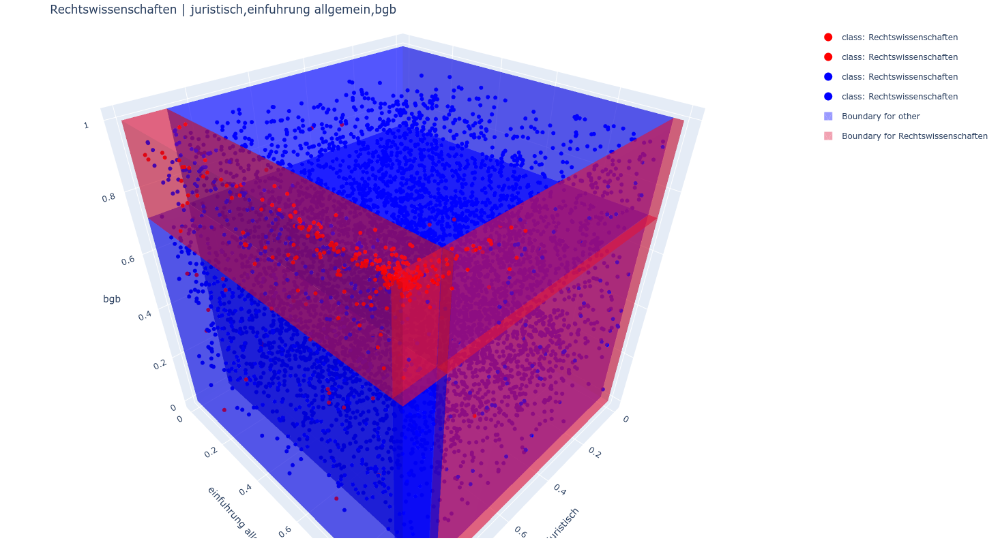

In [36]:
print("Plotting the best Split")
plot_from_nr(np.argmax(scores))